# Analysis of Pain & Adaptive Sampling Models

In [ ]:
from painModels import (
    instant_pain, relative_pain, add_relative_pain, memory_pain, 
    pain_recall, calculate_pains, MAX_PAIN
)
import numpy as np
import pandas as pd
import plotly.express as px

param_names = ["Amplitude (nA)", "Pulse Width (ms)"]
target_name = "Reported Pain"

## Model Param Analysis

In [2]:
max_params = [5, 50]
prec = 200  # precision
test_weights= [5,3]
data = []
for amp in np.linspace(0, max_params[0], num=prec, endpoint=True):
    for pw in np.linspace(0.01, max_params[1], num=prec, endpoint=True):
        data.append((amp, pw, instant_pain([amp,pw], max_params, test_weights)))
# compile data
df = pd.DataFrame(data, columns=param_names+[target_name])
df

,Amplitude (nA),Pulse Width (ms),Reported Pain
0,0.0,0.010000,0.000600
1,0.0,0.261206,0.015672
2,0.0,0.512412,0.030745
3,0.0,0.763618,0.045817
4,0.0,1.014824,0.060889
...,...,...,...
39995,5.0,48.995176,7.939711
39996,5.0,49.246382,7.954783
39997,5.0,49.497588,7.969855
39998,5.0,49.748794,7.984928


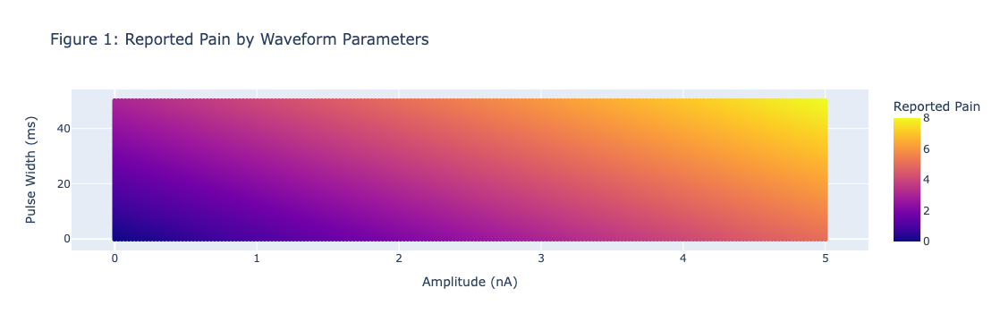

In [3]:
px.scatter(df, x=param_names[0], y=param_names[1], color=target_name,
            title="Figure 1: Reported Pain by Waveform Parameters")

### Visualizing Trends of Individual Params

In [4]:
for i, param in enumerate(param_names):
    # show absolute scatter
    plt = px.scatter(df, param, y=target_name, title="Reported Pain Across All "+param)
    plt.show()

    # show mean line
    test = df[[param, target_name]]
    mv = test.groupby(param)[target_name].mean().to_frame()
    plt = px.line(mv, title="Mean Reported Pain by "+param)
    plt.show()

## Pain Function Analysis

### RPD

In [5]:
# testing RPD
rpd_params = ["Init Pain", "Current Pain", "Change in Pain", "RPD"]
data = []
for p1 in np.linspace(0, MAX_PAIN, num=prec, endpoint=True):
    for p2 in np.linspace(0, MAX_PAIN, num=prec, endpoint=True):
        data.append((p1, p2, (p2-p1), relative_pain(p1, p2)))
df = pd.DataFrame(data, columns=rpd_params)
px.scatter(df, x=rpd_params[0], y=rpd_params[1], color=rpd_params[3],
            title="Figure 2: Relative Pain Distortion by Change in Pain")

In [6]:
px.scatter(df, x=rpd_params[2], y=rpd_params[3], color=rpd_params[3],
            title="Figure 2.5: Relative Pain Distortion by Change in Pain")

### MOP

In [6]:
# testing MOP
mop_params = ["Peak Pain", "Ending Pain", "MOP"]
data = []
for ed in np.linspace(0, MAX_PAIN, num=prec, endpoint=True):
    for pk in np.linspace(ed, MAX_PAIN, num=prec, endpoint=True):
        data.append((pk, ed, memory_pain([pk, ed])))
df = pd.DataFrame(data, columns=mop_params)
px.scatter(df, x=mop_params[1], y=mop_params[0], color=mop_params[2],
            title="Figure 3: Memory of Pain by Peak & End")

### Example Experiment

In [14]:
# evaluation of a hypothetical random experiment
def gen_rand_exp(max_params=[5,50], stim_events=20):
    """ generate a random experiment """
    experiment = []
    for i in range(stim_events):
        rand_params = [(np.random.rand()*mparam + 0.01) for mparam in max_params]
        experiment.append(rand_params)
    return experiment

my_experiment = gen_rand_exp(max_params)
exp = calculate_pains(my_experiment, max_params, test_weights, 5)
exp.head()

,Amplitude (nA),Pulse Width (ms),Stimulation Event,Instant Pain,Percieved Pain,Memory of Pain,Mean Inst Pain,Mean Perc Pain,Total Recalled Pain
0,2.664231,10.707369,1,3.306673,3.853378,5.435494,3.496221,3.52126,4.568852
1,2.448514,11.957483,2,3.165963,3.164973,5.435494,3.496221,3.52126,4.568852
2,4.436096,37.379665,3,6.678876,7.295904,5.435494,3.496221,3.52126,4.568852
3,0.928114,33.333445,4,2.928121,2.224713,5.435494,3.496221,3.52126,4.568852
4,4.087142,13.236708,5,4.881345,5.072099,5.435494,3.496221,3.52126,4.568852


In [15]:
exp_names = list(exp.columns)
px.line(exp, x=exp_names[2], y=exp_names[3:], title="Instantaneous Vs. Distorted & Recalled Pain")